LEVEL 1 Task 1

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

In [2]:
#loading the DataSet
df = pd.read_csv(r"C:\Users\rc\Downloads\Dataset .csv")
df

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,Naml۱ Gurme,208,��stanbul,"Kemanke�� Karamustafa Pa��a Mahallesi, R۱ht۱m ...",Karak�_y,"Karak�_y, ��stanbul",28.977392,41.022793,Turkish,...,Turkish Lira(TL),No,No,No,No,3,4.1,Green,Very Good,788
9547,5908749,Ceviz A��ac۱,208,��stanbul,"Ko��uyolu Mahallesi, Muhittin ��st�_nda�� Cadd...",Ko��uyolu,"Ko��uyolu, ��stanbul",29.041297,41.009847,"World Cuisine, Patisserie, Cafe",...,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,1034
9548,5915807,Huqqa,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.034640,41.055817,"Italian, World Cuisine",...,Turkish Lira(TL),No,No,No,No,4,3.7,Yellow,Good,661
9549,5916112,A���k Kahve,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.036019,41.057979,Restaurant Cafe,...,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,901


In [3]:
#Drop Missing Values in "cuisines" column
df_cuisines = df["Cuisines"].dropna()

Top 3 Most Common Cuisines

In [4]:
cuisines_count = df['Cuisines'].str.split(',',).explode().value_counts()
top_three_cuisine = cuisines_count.head(3)
print(top_three_cuisine)

Cuisines
North Indian    2992
 Chinese        1880
 Fast Food      1314
Name: count, dtype: int64


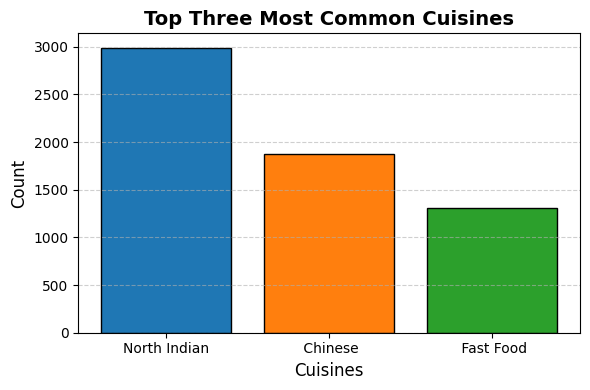

In [5]:
# Optimized bar chart for top 3 cuisines
plt.figure(figsize=(6, 4))
plt.bar(
    top_three_cuisine.index,
    top_three_cuisine.values,
    color=['#1f77b4', '#ff7f0e', '#2ca02c'],  # blue, orange, green
    edgecolor='black'
)

plt.title("Top Three Most Common Cuisines", fontsize=14, fontweight='bold')
plt.xlabel("Cuisines", fontsize=12)
plt.ylabel("Count", fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


Calculate The Percentage of Restaurants That serve Each of the Top Cuisines

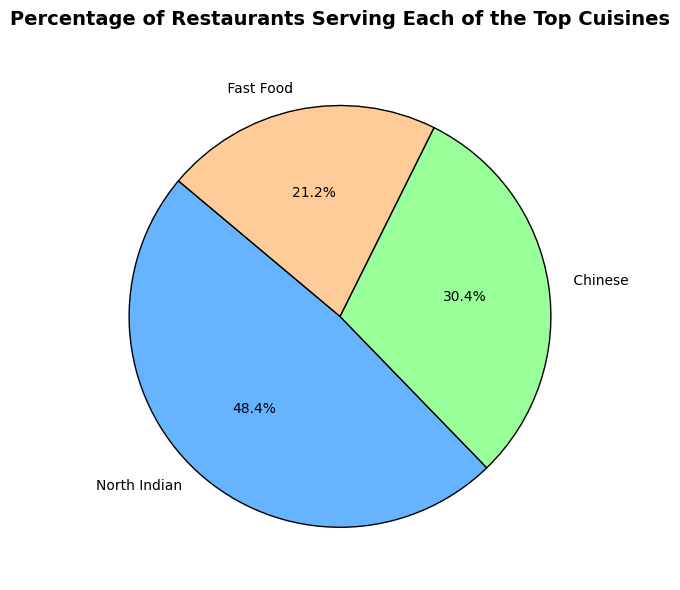

In [6]:
# Calculate percentage
total_rest = len(df_cuisines)
top_cuisines_percentage = (top_three_cuisine / total_rest) * 100

# Define color palette 
colors = ['#66b3ff', '#99ff99', '#ffcc99']  # blue, green, orange

plt.figure(figsize=(6, 6))
plt.pie(
    top_three_cuisine.values,
    labels=top_three_cuisine.index,
    autopct='%1.1f%%',
    startangle=140,
    colors=colors,
    wedgeprops={'edgecolor': 'black', 'linewidth': 1}
)

plt.title(
    "Percentage of Restaurants Serving Each of the Top Cuisines",
    fontsize=14,
    fontweight='bold',
    pad=20
)
plt.tight_layout()
plt.show()


LEVEL 1 Task 2

Identify the city with the highest number of restaurants in the dataset.

In [7]:
# Count restaurants by city and get the top city and its count
city_count = df['City'].value_counts()
top_city = city_count.idxmax()
top_count = city_count.max()

print('The city with the highest number of restaurants is ' + str(top_city))
print('Restaurant count: ' + str(top_count))

The city with the highest number of restaurants is New Delhi
Restaurant count: 5473


Calculate the average rating for restaurants in each city.

In [8]:
# Average rating per city (original dataframe)
avg_rating = df.groupby('City')['Aggregate rating'].mean().sort_values(ascending=False)
print('Average rating for restaurants in each city.')
print(avg_rating)

Average rating for restaurants in each city.
City
Inner City          4.900000
Quezon City         4.800000
Makati City         4.650000
Pasig City          4.633333
Mandaluyong City    4.625000
                      ...   
New Delhi           2.438845
Montville           2.400000
Mc Millan           2.400000
Noida               2.036204
Faridabad           1.866932
Name: Aggregate rating, Length: 141, dtype: float64


city with the highest average rating.

In [9]:
average_ratings = df.groupby('City')['Aggregate rating'].mean()
top_city = average_ratings.idxmax()
top_avg = average_ratings.max()

print('City with the highest average rating: ' + str(top_city))
print('Average rating: ' + str(top_avg))


City with the highest average rating: Inner City
Average rating: 4.9


Level 1 Task 3

The distribution of price ranges among the restaurants.

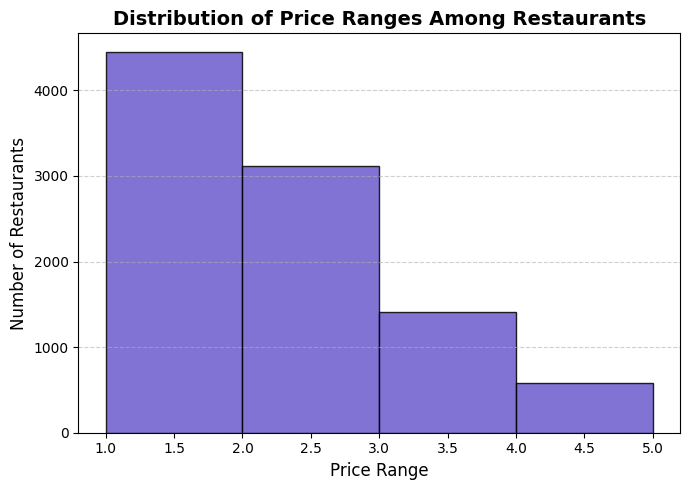

In [10]:
# Clean column names
df.columns = df.columns.str.strip().str.lower()  # lowercase + remove spaces

# Convert 'price range' to numeric safely
if 'price range' in df.columns:
    col = 'price range'
elif 'price_range' in df.columns:
    col = 'price_range'
else:
    raise KeyError("Column 'price range' not found. Please check df.columns output.")

df[col] = pd.to_numeric(df[col], errors='coerce')

# Drop missing/invalid entries
price_range_clean = df[col].dropna().astype(int)

# Plot histogram
plt.figure(figsize=(7, 5))
plt.hist(
    price_range_clean,
    bins=range(price_range_clean.min(), price_range_clean.max() + 2),
    color='#6A5ACD',  # slate blue
    edgecolor='black',
    alpha=0.85
)

plt.title("Distribution of Price Ranges Among Restaurants", fontsize=14, fontweight='bold')
plt.xlabel("Price Range", fontsize=12)
plt.ylabel("Number of Restaurants", fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


 

Calculate the percentage of restaurants in each price range category.

In [11]:
# Clean and normalize column names
df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_')

# Check if 'price_range' exists after cleaning
if 'price_range' not in df.columns:
    raise KeyError("Column 'price_range' not found even after cleaning. Please check df.columns output.")

# Get total number of restaurants
total_rest = len(df)

# Count restaurants per price range
price_range_per_count = df['price_range'].value_counts().sort_index()

# Calculate percentage
percentage_per_price_range = (price_range_per_count / total_rest) * 100

print("Percentage of restaurants in each price range category:\n")
for price, pct in percentage_per_price_range.items():
    print(f"Price Range {price}: {pct:.2f}%")



Percentage of restaurants in each price range category:

Price Range 1: 46.53%
Price Range 2: 32.59%
Price Range 3: 14.74%
Price Range 4: 6.14%


LEVEL 1 TASK 4

Determine the percentage of restaurants that offer online delivery.

In [12]:
# Clean column names
df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_')

# Verify if the column exists
if 'has_online_delivery' not in df.columns:
    raise KeyError("Column 'has_online_delivery' not found. Please check df.columns output.")

# Calculate percentage of restaurants with online delivery
total_rest = len(df)

# Safely handle missing or inconsistent data (like 'Yes', 'No', 'YES', etc.)
df['has_online_delivery'] = df['has_online_delivery'].astype(str).str.strip().str.lower()

restaurants_with_online_delivery = df['has_online_delivery'].value_counts().get('yes', 0)
percentage_with_online_delivery = (restaurants_with_online_delivery / total_rest) * 100

print(f"The percentage of restaurants that offer online delivery: {percentage_with_online_delivery:.2f}%")



The percentage of restaurants that offer online delivery: 25.66%


The average ratings of restaurant with and without online delivery.

In [13]:
# Clean column names
df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_')

# Normalize values
df['has_online_delivery'] = df['has_online_delivery'].astype(str).str.strip().str.lower()

# Calculate average ratings
average_rating_with_online_delivery = df[df['has_online_delivery'] == 'yes']['aggregate_rating'].mean()
average_rating_without_online_delivery = df[df['has_online_delivery'] == 'no']['aggregate_rating'].mean()

print("Average rating with online delivery:", round(average_rating_with_online_delivery, 2))
print("Average rating without online delivery:", round(average_rating_without_online_delivery, 2))


Average rating with online delivery: 3.25
Average rating without online delivery: 2.47


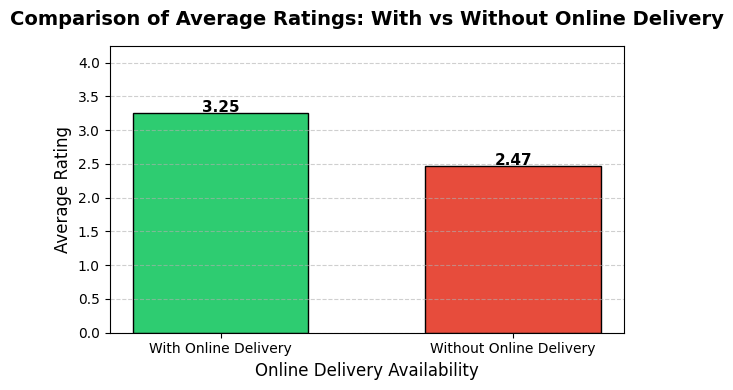

In [14]:
#bar chart comparing online vs offline delivery ratings
labels = ['With Online Delivery', 'Without Online Delivery']
average_ratings = [average_rating_with_online_delivery, average_rating_without_online_delivery]
colors = ['#2ecc71', '#e74c3c']  # modern green & red shades

plt.figure(figsize=(6, 4))
bars = plt.bar(labels, average_ratings, color=colors, edgecolor='black', width=0.6)

# Add value labels on top of bars
for bar in bars:
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height() + 0.02,
        f"{bar.get_height():.2f}",
        ha='center',
        fontsize=11,
        fontweight='bold'
    )

plt.title("Comparison of Average Ratings: With vs Without Online Delivery", fontsize=14, fontweight='bold', pad=15)
plt.xlabel("Online Delivery Availability", fontsize=12)
plt.ylabel("Average Rating", fontsize=12)
plt.ylim(0, max(average_ratings) + 1)  # adds headroom for labels
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


LEVEL 2 Task 1

Analyze the distribution of aggregate ratings and determine the most common rating range.

In [15]:
# Clean column names
df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_')

# Count aggregate ratings
rating_counts = df['aggregate_rating'].value_counts().sort_index()


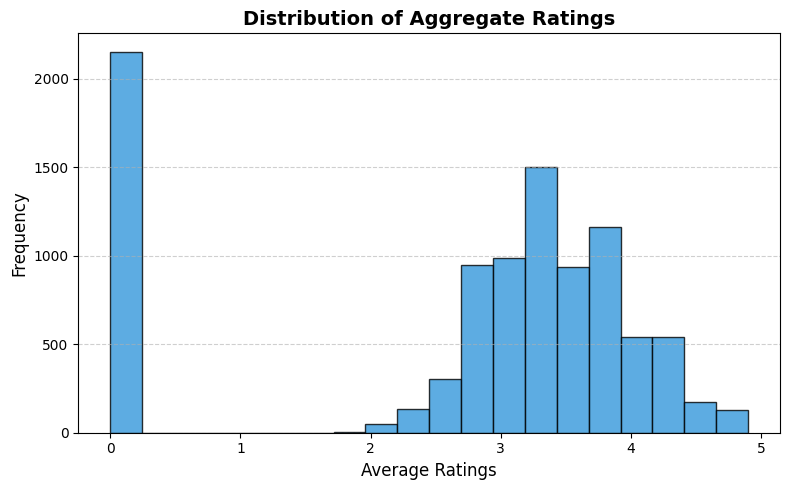

In [16]:
# Access aggregate ratings column
aggregate_ratings = df['aggregate_rating']

# Plot histogram
plt.figure(figsize=(8, 5))
plt.hist(aggregate_ratings.dropna(), bins=20, edgecolor='black', color='#3498db', alpha=0.8)
plt.title('Distribution of Aggregate Ratings', fontsize=14, fontweight='bold')
plt.xlabel("Average Ratings", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


In [17]:
most_common_rating_range = rating_counts.idxmax()
print("The most common rating is ", most_common_rating_range)

The most common rating is  0.0


The average number of votes received by restaurants.

In [18]:
# Ensure column names are clean
df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_')

# Calculate average votes
average_votes = df['votes'].mean()

print("The average number of votes received by restaurants:", round(average_votes, 2))


The average number of votes received by restaurants: 156.91


LEVEL 2 Task 2

In [19]:
df = df.dropna(subset=['cuisines'])

Identify the most common combinations of cuisines in the dataset.

In [20]:
common_cuisine_combination = df['cuisines'].value_counts().head(10)

In [21]:
print("Top 10 most common Cuisine combination")
print(common_cuisine_combination)

Top 10 most common Cuisine combination
cuisines
North Indian                      936
North Indian, Chinese             511
Chinese                           354
Fast Food                         354
North Indian, Mughlai             334
Cafe                              299
Bakery                            218
North Indian, Mughlai, Chinese    197
Bakery, Desserts                  170
Street Food                       149
Name: count, dtype: int64


Determine if certain cuisine combinations tend to have higher ratings.

In [22]:
# Clean column names
df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_')

# Group by cuisines and get top 10 cuisines by average rating
cuisine_rating = df.groupby('cuisines')['aggregate_rating'].mean().nlargest(10)
print("Top 10 Highest Rating Combination")
print(cuisine_rating)

Top 10 Highest Rating Combination
cuisines
American, BBQ, Sandwich         4.9
American, Burger, Grill         4.9
American, Caribbean, Seafood    4.9
American, Coffee and Tea        4.9
American, Sandwich, Tea         4.9
BBQ, Breakfast, Southern        4.9
Burger, Bar Food, Steak         4.9
Continental, Indian             4.9
European, Asian, Indian         4.9
European, Contemporary          4.9
Name: aggregate_rating, dtype: float64


LEVEL 2 Task 3

In [23]:
import folium 
from IPython.display import display
from sklearn.cluster import KMeans

In [24]:
df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_')

# Drop rows with missing latitude or longitude
df = df.dropna(subset=['latitude', 'longitude'])

# Check result
print(df[['latitude', 'longitude']].head())

    latitude   longitude
0  14.565443  121.027535
1  14.553708  121.014101
2  14.581404  121.056831
3  14.585318  121.056475
4  14.584450  121.057508


Plot the locations of restaurants on a map using longitude and latitude coordinates.

In [25]:
map_center = [df['latitude'].mean(),df['longitude'].mean()]
restaurant_map = folium.Map(location = map_center ,zoom_start=12)

In [26]:
# Assuming df is already cleaned
df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_')
# Create a map centered at the average latitude and longitude
restaurant_map = folium.Map(
    location=[df['latitude'].mean(), df['longitude'].mean()],
    zoom_start=12
)
# Add markers for each restaurant
for index, row in df.iterrows():
    folium.Marker(
        [row['latitude'], row['longitude']],
        popup=row['restaurant_name']  # use cleaned column name
    ).add_to(restaurant_map)

# Display the map in Jupyter Notebook
restaurant_map



Identify any patterns or clusters of restaurants in specific areas.

In [27]:
#Extract longitude and latitude
X=df[['latitude','longitude']]

In [28]:
#perform clustring analysis
kmeans = KMeans(n_clusters = 5,random_state=42 , n_init=10)
df['Cluster'] = kmeans.fit_predict(X)

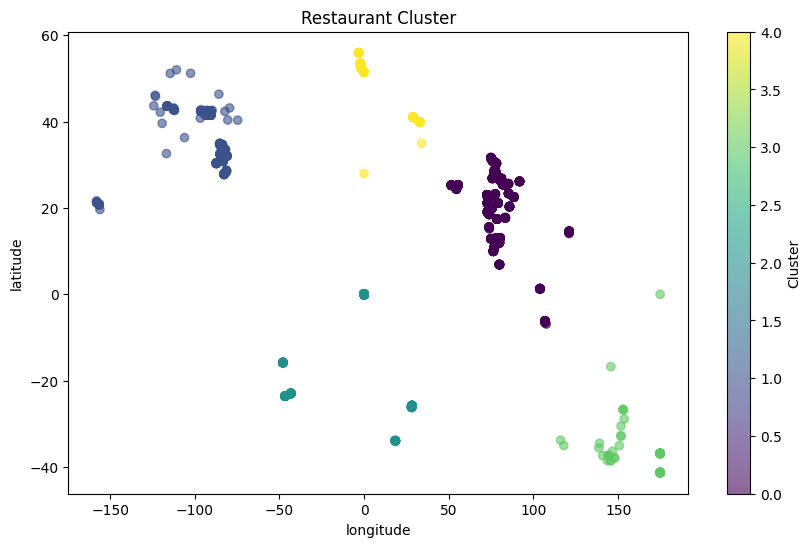

In [29]:
plt.figure(figsize=(10,6))
plt.scatter(df['longitude'] ,df['latitude'],c=df['Cluster'],cmap='viridis',alpha=0.6)
plt.xlabel('longitude')
plt.ylabel('latitude')
plt.title('Restaurant Cluster')
plt.colorbar(label ='Cluster')
plt.show()

LEVEL 2 TASK 4

Identify if there are any restaurant chains present in the dataset.

In [30]:
df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_')

# Identify restaurant chains
restaurant_chains = df['restaurant_name'].value_counts()

In [31]:
#Filter chains with multiple locations
restaurant_chains = restaurant_chains[restaurant_chains > 1]

In [32]:
# Display top 10 restaurant chains by number of locations
print("Top 10 Restaurant Chains by Number of Locations")
print(restaurant_chains.head(10))


Top 10 Restaurant Chains by Number of Locations
restaurant_name
Cafe Coffee Day     83
Domino's Pizza      79
Subway              63
Green Chick Chop    51
McDonald's          48
Keventers           34
Pizza Hut           30
Giani               29
Baskin Robbins      28
Barbeque Nation     26
Name: count, dtype: int64


Analyze the ratings and popularity of different restaurant chains.

In [33]:
# Ensure column names are cleaned
df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_')

# Filter data to include only restaurant chains
chain_data = df[df['restaurant_name'].isin(restaurant_chains.index)]


In [34]:
# Ensure column names are cleaned
chain_data.columns = chain_data.columns.str.strip().str.lower().str.replace(' ', '_')

# Compute average rating and total votes for each restaurant chain
chain_ratings = chain_data.groupby('restaurant_name')['aggregate_rating'].mean()
chain_votes = chain_data.groupby('restaurant_name')['votes'].sum()

In [35]:
# Combine average rating and total votes into one DataFrame
chain_analysis = pd.DataFrame({
    "Average Rating": chain_ratings,
    "Total Votes": chain_votes
})

In [36]:
# Get the top 10 highest-rated restaurant chains
top_rated_chains = chain_analysis.nlargest(10, 'Average Rating')

print('\nTop 10 Highest-Rated Restaurant Chains:')
print(top_rated_chains)



Top 10 Highest-Rated Restaurant Chains:
                           Average Rating  Total Votes
restaurant_name                                       
Talaga Sampireun                    4.900         5514
AB's Absolute Barbecues             4.850         3151
Silantro Fil-Mex                    4.850         1364
AB's - Absolute Barbecues           4.825        13400
Naturals Ice Cream                  4.800         3094
Gymkhana                            4.700          328
The Cheesecake Factory              4.650         3010
Dishoom                             4.600         1269
Garota de Ipanema                   4.600           59
Chili's                             4.580         8156


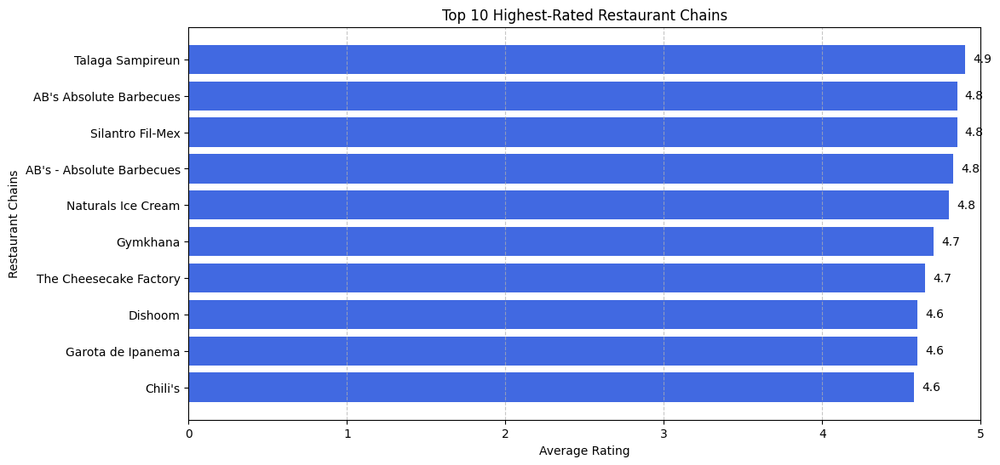

In [37]:
# Plot highest-rated restaurant chains
plt.figure(figsize=(12,6))
plt.barh(top_rated_chains.index[::-1], top_rated_chains["Average Rating"][::-1], color='royalblue')
plt.xlabel("Average Rating")
plt.ylabel("Restaurant Chains")
plt.title("Top 10 Highest-Rated Restaurant Chains")
plt.xlim(0, 5)
plt.grid(axis="x", linestyle="--", alpha=0.7)

# Display values on bars
for i, value in enumerate(top_rated_chains["Average Rating"][::-1]):
    plt.text(value + 0.05, i, f"{value:.1f}", va="center", fontsize=10)

plt.show()


In [38]:
#Get the top 10 most popular chains based on total votes

top_popular_chains = chain_analysis.nlargest(10,"Total Votes")
print('\n Top 10 Most Popular Restaurant Chains by Total Votes')
print(top_popular_chains)


 Top 10 Most Popular Restaurant Chains by Total Votes
                           Average Rating  Total Votes
restaurant_name                                       
Barbeque Nation                  4.353846        28142
AB's - Absolute Barbecues        4.825000        13400
Big Chill                        4.475000        10853
Farzi Cafe                       4.366667        10098
Truffles                         3.950000         9682
Chili's                          4.580000         8156
Joey's Pizza                     4.250000         7807
Big Yellow Door                  4.266667         7511
Saravana Bhavan                  4.133333         7238
Starbucks                        3.805556         7139


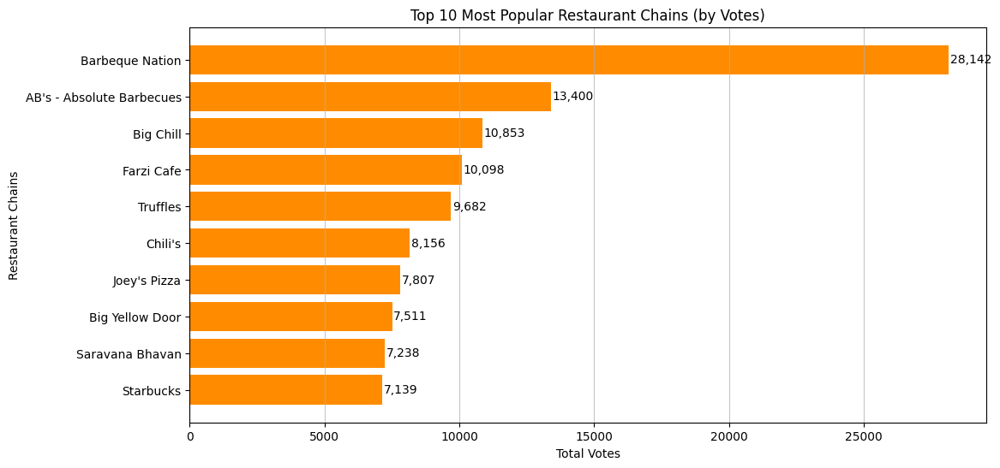

In [39]:
# Plot most popular restaurant chains based on total votes
plt.figure(figsize=(12, 6))
plt.barh(top_popular_chains.index[::-1], top_popular_chains["Total Votes"][::-1], color="darkorange")
plt.xlabel("Total Votes")
plt.ylabel("Restaurant Chains")
plt.title("Top 10 Most Popular Restaurant Chains (by Votes)")
plt.grid(axis="x", linestyle="-", alpha=0.7)

# Display values on bars
for i, value in enumerate(top_popular_chains["Total Votes"][::-1]):
    plt.text(value + 50, i, f"{value:,}", va="center", fontsize=10)

plt.show()


LEVEL 3  TASK 1

Analyze the text reviews to identify the most common positive and negative keywords.

In [40]:
# Count occurrences of rating text categories
rating_counts = df['rating_text'].value_counts()

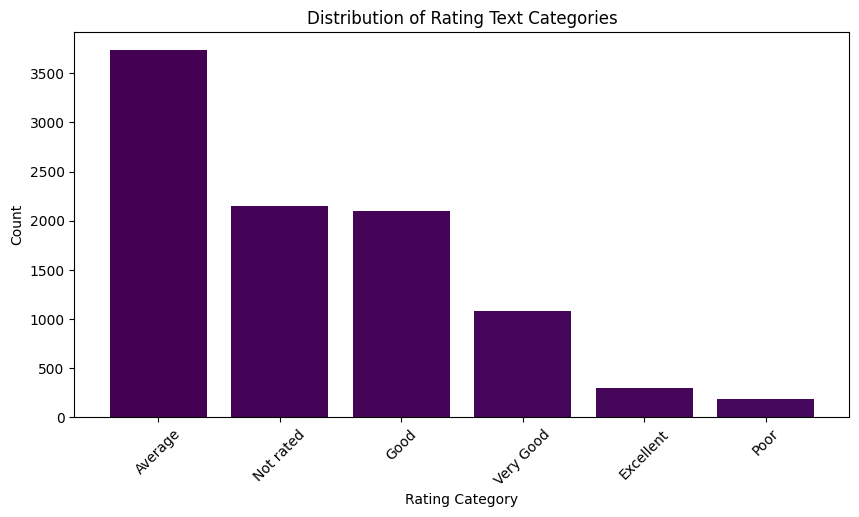

In [41]:
# Visualize the distribution of rating text categories
plt.figure(figsize=(10,5))
plt.bar(rating_counts.index, rating_counts.values, color=plt.cm.viridis(range(len(rating_counts))))
plt.xticks(rotation=45)
plt.xlabel("Rating Category")
plt.ylabel("Count")
plt.title("Distribution of Rating Text Categories")
plt.show()



In [42]:
#Display the Most Common rating text categories
rating_counts

rating_text
Average      3734
Not rated    2148
Good         2096
Very Good    1078
Excellent     300
Poor          186
Name: count, dtype: int64

In [43]:
from collections import Counter

In [44]:
from collections import Counter

# Standardize column names
df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_')

# Define positive and negative rating categories
positive_ratings = ["excellent", "very good", "good"]
negative_ratings = ["average", "poor"]

# Extract words dynamically from rating_text column
positive_words = " ".join(df[df["rating_text"].isin(positive_ratings)]["rating_text"]).lower().split()
negative_words = " ".join(df[df["rating_text"].isin(negative_ratings)]["rating_text"]).lower().split()

# Count the most common words
positive_word_counts = Counter(positive_words).most_common(3)
negative_word_counts = Counter(negative_words).most_common(2)

# Display final result
print(positive_word_counts, negative_word_counts)


[] []


Calculate the average length of reviews and explore if there is a relationship between review length and rating.

In [45]:

df["rating_the_length"] = df["rating_text"].apply(lambda x: len(x.split()))


In [46]:
average_length = df["rating_the_length"].mean()

Display relation between ratingtext  length and aggregate rating

Index(['restaurant_id', 'restaurant_name', 'country_code', 'city', 'address',
       'locality', 'locality_verbose', 'longitude', 'latitude', 'cuisines',
       'average_cost_for_two', 'currency', 'has_table_booking',
       'has_online_delivery', 'is_delivering_now', 'switch_to_order_menu',
       'price_range', 'aggregate_rating', 'rating_color', 'rating_text',
       'votes', 'cluster', 'rating_the_length'],
      dtype='object')


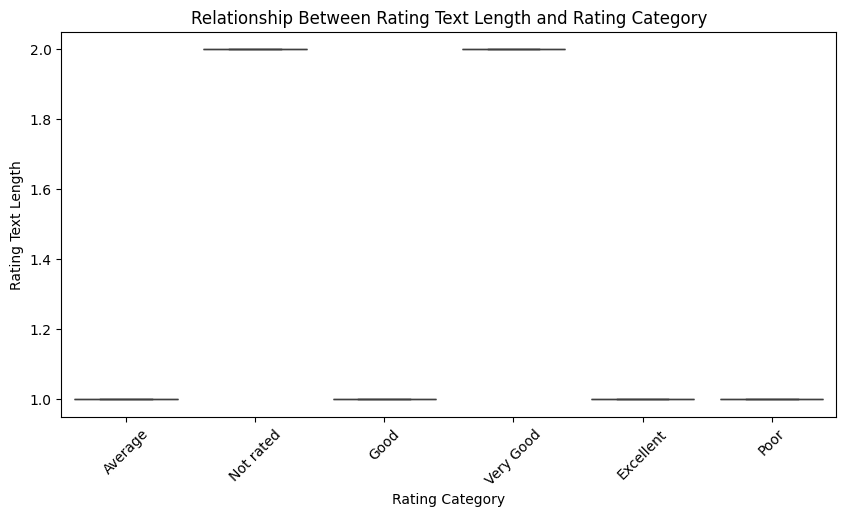

Average length of rating text: 1.3380842590651856


In [47]:
# Make sure column names exist
print(df.columns)

plt.figure(figsize=(10, 5))
sns.boxplot(
    x="rating_text", 
    y="rating_the_length", 
    data=df, 
    order=rating_counts.index  # rating_counts should also match lowercase column
)
plt.xticks(rotation=45)
plt.xlabel("Rating Category")
plt.ylabel("Rating Text Length")
plt.title("Relationship Between Rating Text Length and Rating Category")
plt.show()

# Calculate average length
average_length = df["rating_the_length"].mean()
print("Average length of rating text:", average_length)



LEVEL 3 TASK 2

Identify the restaurants with the highest and lowest number of votes.

In [48]:
# Get the restaurant with the highest votes
highest_votes = df.loc[df["votes"].idxmax()]
# Get the restaurant with the lowest votes
lowest_votes = df.loc[df["votes"].idxmin()]

In [49]:
# Display only Restaurant Name, Votes, and Aggregate rating
highest_votes_info = highest_votes[["restaurant_name", "votes", "aggregate_rating"]]
lowest_votes_info = lowest_votes[["restaurant_name", "votes", "aggregate_rating"]]

print("Restaurant with highest votes:\n", highest_votes_info)
print("\nRestaurant with lowest votes:\n", lowest_votes_info)

Restaurant with highest votes:
 restaurant_name      Toit
votes               10934
aggregate_rating      4.8
Name: 728, dtype: object

Restaurant with lowest votes:
 restaurant_name     Cantinho da Gula
votes                              0
aggregate_rating                 0.0
Name: 69, dtype: object


Analyze if there is a correlation between the number of votes and the rating of a restaurant.

In [50]:
# Compute correlation between votes and aggregate rating
correlation = df["votes"].corr(df["aggregate_rating"])
print("Correlation between Votes and Aggregate Rating:", correlation)

Correlation between Votes and Aggregate Rating: 0.31347418032500063


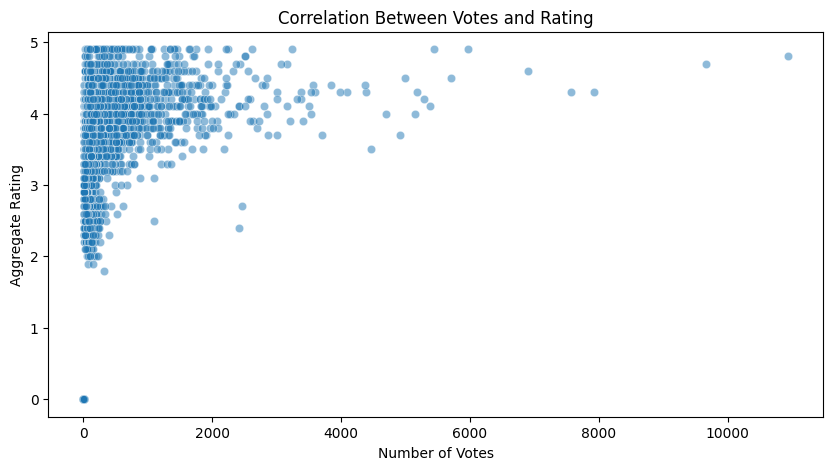

In [51]:
#Visualize the relationship using a scatter plot

plt.figure(figsize=(10, 5))
sns.scatterplot(x=df["votes"], y=df["aggregate_rating"], alpha=0.5)
plt.xlabel("Number of Votes")
plt.ylabel("Aggregate Rating")
plt.title("Correlation Between Votes and Rating")
plt.show()
